#1. OCR Part

In [ ]:
!pip install constants

  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of constants to determine which version is compatible with other requirements. This could take a while.
  Preparing metadata (setup.py) ... done
  Created wheel for constants: filename=constants-0.6.0-py3-none-any.whl size=5457 sha256=df1a1b736f1d2b95f433d6970a751feb956120ce65c0581035668cf34628c3b8
  Stored in directory: /root/.cache/pip/wheels/5b/96/3c/386c2342a8a1bdd317f2f250bd076c13938c6f598c4a40ec14
Successfully built constants


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import re
import constants
import os
import glob
import requests
import pandas as pd
import multiprocessing
import time
from time import time as timer
from tqdm import tqdm
import numpy as np
from pathlib import Path
from functools import partial
import requests
import urllib
from PIL import Image

In [ ]:
def common_mistake(unit):
    if unit in constants.allowed_units:
        return unit
    if unit.replace('ter', 'tre') in constants.allowed_units:
        return unit.replace('ter', 'tre')
    if unit.replace('feet', 'foot') in constants.allowed_units:
        return unit.replace('feet', 'foot')
    return unit

def parse_string(s):
    s_stripped = "" if s==None or str(s)=='nan' else s.strip()
    if s_stripped == "":
        return None, None
    pattern = re.compile(r'^-?\d+(\.\d+)?\s+[a-zA-Z\s]+$')
    if not pattern.match(s_stripped):
        raise ValueError("Invalid format in {}".format(s))
    parts = s_stripped.split(maxsplit=1)
    number = float(parts[0])
    unit = common_mistake(parts[1])
    if unit not in constants.allowed_units:
        raise ValueError("Invalid unit [{}] found in {}. Allowed units: {}".format(
            unit, s, constants.allowed_units))
    return number, unit


def create_placeholder_image(image_save_path):
    try:
        placeholder_image = Image.new('RGB', (100, 100), color='black')
        placeholder_image.save(image_save_path)
    except Exception as e:
        return

def download_image(image_link, save_folder, retries=3, delay=3):
    if not isinstance(image_link, str):
        return

    filename = Path(image_link).name
    image_save_path = os.path.join(save_folder, filename)

    if os.path.exists(image_save_path):
        return

    for _ in range(retries):
        try:
            urllib.request.urlretrieve(image_link, image_save_path)
            return
        except:
            time.sleep(delay)

    create_placeholder_image(image_save_path) #Create a black placeholder image for invalid links/images

def download_images(image_links, download_folder, allow_multiprocessing=True):
    if not os.path.exists(download_folder):
        os.makedirs(download_folder)

    if allow_multiprocessing:
        download_image_partial = partial(
            download_image, save_folder=download_folder, retries=3, delay=3)

        with multiprocessing.Pool(64) as pool:
            list(tqdm(pool.imap(download_image_partial, image_links), total=len(image_links)))
            pool.close()
            pool.join()
    else:
        for image_link in tqdm(image_links, total=len(image_links)):
            download_image(image_link, save_folder=download_folder, retries=3, delay=3)

def delete_all_files(folder_path):
    # Get all files in the folder (does not delete subfolders or their contents)
    files = glob.glob(os.path.join(folder_path, "*"))

    # Loop through and delete each file
    for file in files:
        try:
            if os.path.isfile(file):
                os.remove(file)
                print(f"Deleted file: {file}")
            else:
                print(f"Skipping non-file: {file}")
        except Exception as e:
            print(f"Error deleting {file}: {e}")

def get_folder_info(folder_path):
    total_size = 0
    num_files = 0
    num_folders = 0

    # Walk through all directories and files in the folder
    for dirpath, dirnames, filenames in os.walk(folder_path):
        # Increment folder count
        num_folders += len(dirnames)
        # Increment file count and calculate size
        num_files += len(filenames)
        for file in filenames:
            file_path = os.path.join(dirpath, file)
            total_size += os.path.getsize(file_path)

    return {
        "total_size_bytes": total_size,
        "total_size_mb": total_size / (1024 * 1024),
        "num_files": num_files,
        "num_folders": num_folders
    }

In [ ]:
DATASET_FOLDER = './dataset/'
train = pd.read_csv(os.path.join(DATASET_FOLDER, 'train.csv'))
sample_train = pd.read_csv(os.path.join(DATASET_FOLDER, 'train.csv'), nrows=1000)
test = pd.read_csv(os.path.join(DATASET_FOLDER, 'test.csv'))
sample_test = pd.read_csv(os.path.join(DATASET_FOLDER, 'sample_test.csv'))
sample_test_out = pd.read_csv(os.path.join(DATASET_FOLDER, 'sample_test_out.csv'))

In [ ]:
#download
# first check for the first 1000 images
download_images(sample_train['image_link'], './trainImages')
# if works then delete the trainImages folder
# and download all by remvoing the comment from the line below and running it instead of the above one
# download_images(train['image_link'], './trainImages')

100%|██████████| 1000/1000 [00:18<00:00, 55.52it/s]


In [ ]:
# to get folder info (its size in mb, num of files, num of subfolders)
folder_path = './trainImages'
info = get_folder_info(folder_path)

print(f"Folder Size: {info['total_size_bytes']} bytes ({info['total_size_mb']} MB)")
print(f"Number of files: {info['num_files']}")
print(f"Number of subfolders: {info['num_folders']}")


Folder Size: 193253337 bytes (184.30074405670166 MB)
Number of files: 987
Number of subfolders: 0


In [ ]:
# To delete all files in the folder
# folder_path = "./trainImages"
# delete_all_files(folder_path)

In [ ]:
!python -m pip install paddlepaddle-gpu

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 758.9/758.9 MB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.4/76.4 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 4.2 MB/s eta 0:00:00


In [ ]:
!pip install paddleocr

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.4/88.4 kB 3.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 407.5/407.5 kB 10.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 14.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 908.3/908.3 kB 27.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 244.3/244.3 kB 11.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 65.3 MB/s eta 0:00:00
  Created wheel for fire: filename=fire-0.6.0-py2.py3-none-any.whl size=117030 sha256=c4e8589776873cbb4780263b3d1ff2eee972f996a4bd9a47189825e932614fa7
  Stored in directory: /root/.cache/pip/wheels/d6/6d/5d/5b73fa0f46d01a793713f8859201361e9e581ced8c75e5c6a3
Successfully built fire


In [ ]:
!git clone https://github.com/PaddlePaddle/PaddleOCR

Cloning into 'PaddleOCR'...
remote: Enumerating objects: 51247, done.
remote: Counting objects: 100% (2471/2471), done.
remote: Compressing objects: 100% (1194/1194), done.
remote: Total 51247 (delta 1289), reused 2243 (delta 1230), pack-reused 48776 (from 1)
Receiving objects: 100% (51247/51247), 385.61 MiB | 28.18 MiB/s, done.
Resolving deltas: 100% (35678/35678), done.
Updating files: 100% (2390/2390), done.


In [ ]:
from paddleocr import PaddleOCR, draw_ocr # main OCR dependencies
from matplotlib import pyplot as plt # plot images
import cv2 #opencv

/usr/local/lib/python3.10/dist-packages/paddle/base/framework.py:688: UserWarning: You are using GPU version Paddle, but your CUDA device is not set properly. CPU device will be used by default.
  warnings.warn(


In [ ]:
# Setup model
ocr_model = PaddleOCR(lang='en')

download https://paddleocr.bj.bcebos.com/PP-OCRv3/english/en_PP-OCRv3_det_infer.tar to /root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer/en_PP-OCRv3_det_infer.tar


100%|██████████| 4.00M/4.00M [00:17<00:00, 224kiB/s] 


download https://paddleocr.bj.bcebos.com/PP-OCRv4/english/en_PP-OCRv4_rec_infer.tar to /root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer/en_PP-OCRv4_rec_infer.tar


100%|██████████| 10.2M/10.2M [00:18<00:00, 560kiB/s] 


download https://paddleocr.bj.bcebos.com/dygraph_v2.0/ch/ch_ppocr_mobile_v2.0_cls_infer.tar to /root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer/ch_ppocr_mobile_v2.0_cls_infer.tar


100%|██████████| 2.19M/2.19M [00:14<00:00, 152kiB/s]

[2024/09/15 22:28:54] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, use_mlu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='/root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6, max_text_length=25, rec_c

In [ ]:
img_path = os.path.join("./trainImages", "71gSRbyXmoL.jpg" )
result = ocr_model.ocr(img_path)[0]
for res in result:
  print (res[1][0])

[2024/09/15 22:28:56] ppocr WARNING: Since the angle classifier is not initialized, it will not be used during the forward process
[2024/09/15 22:28:57] ppocr DEBUG: dt_boxes num : 17, elapsed : 0.9449379444122314
[2024/09/15 22:28:59] ppocr DEBUG: rec_res num  : 17, elapsed : 1.988062858581543
TEARRIFIC
LEBENSMITTELECHT
Cup
HDAY
GEPRAGTES
DESIGN
AS YOULIKE
BEST
Designed in
colke
OR
Berlin
OR
cold
LIZENZIERTE UND GESCHUTZTE DESIGNS


In [ ]:
# Extracting detected components
boxes = [res[0] for res in result] #
texts = [res[1][0] for res in result]
scores = [res[1][1] for res in result]

In [ ]:
# Specifying font path for draw_ocr method
font_path = os.path.join('PaddleOCR', 'doc', 'fonts', 'latin.ttf')

In [ ]:
# Import our image - drug 1/2/3
# imports image
img = cv2.imread(img_path)

# reorders the color channels
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

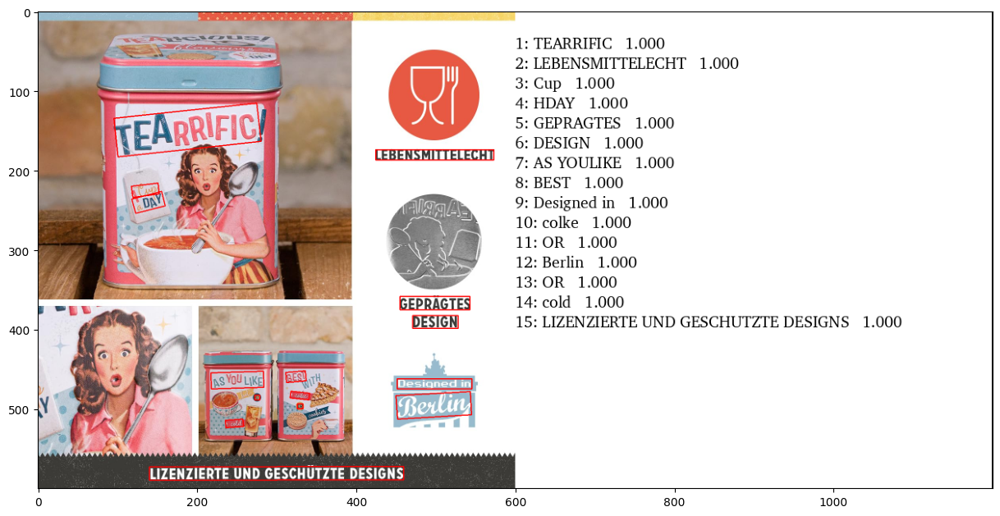

In [ ]:
# Visualize our image and detections
# resizing display area
plt.figure(figsize=(15,15))

# draw annotations on image
annotated = draw_ocr(img, boxes, texts, font_path=font_path)

# show the image using matplotlib
plt.imshow(annotated)

[2024/09/15 22:29:00] ppocr WARNING: Since the angle classifier is not initialized, it will not be used during the forward process
[2024/09/15 22:29:01] ppocr DEBUG: dt_boxes num : 5, elapsed : 0.480358362197876
[2024/09/15 22:29:01] ppocr DEBUG: rec_res num  : 5, elapsed : 0.5497128963470459
Image: 81fRIl3bhHL.jpg
[2024/09/15 22:29:01] ppocr WARNING: Since the angle classifier is not initialized, it will not be used during the forward process
[2024/09/15 22:29:02] ppocr DEBUG: dt_boxes num : 21, elapsed : 0.37818193435668945
[2024/09/15 22:29:03] ppocr DEBUG: rec_res num  : 21, elapsed : 1.5246422290802002
Image: 8180lCAlYaL.jpg
[2024/09/15 22:29:03] ppocr WARNING: Since the angle classifier is not initialized, it will not be used during the forward process
[2024/09/15 22:29:04] ppocr DEBUG: dt_boxes num : 25, elapsed : 0.4325377941131592
[2024/09/15 22:29:08] ppocr DEBUG: rec_res num  : 25, elapsed : 3.598461151123047
Image: 71ZTyrP+83L.jpg
[2024/09/15 22:29:08] ppocr WARNING: Since 

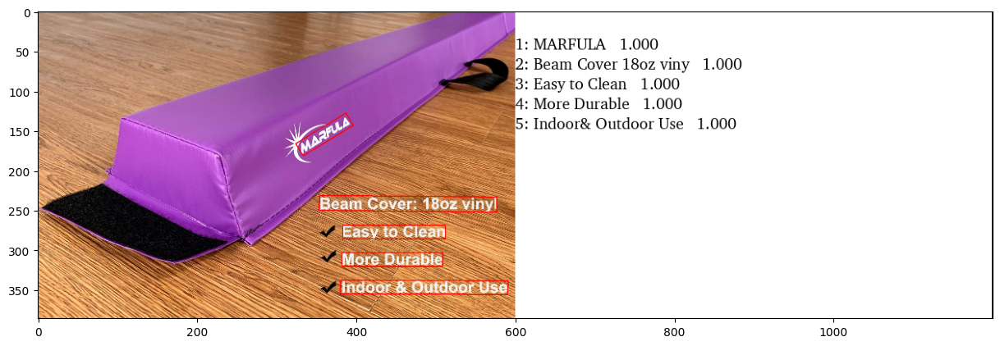

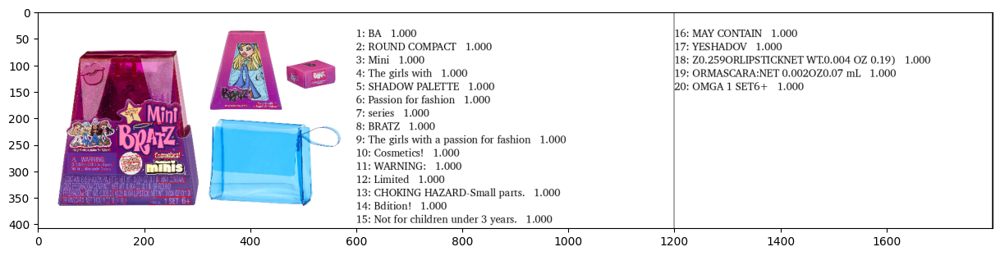

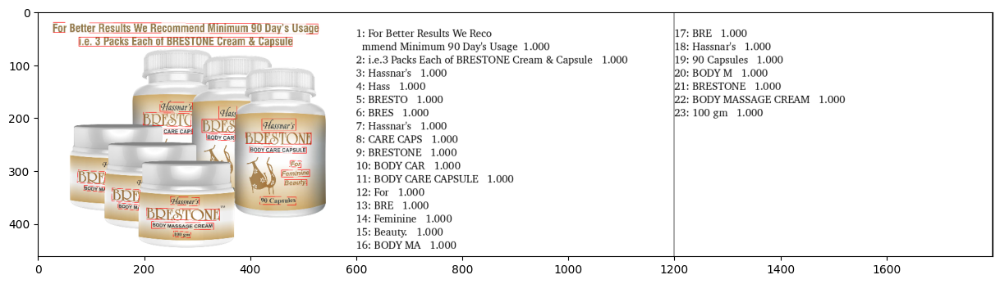

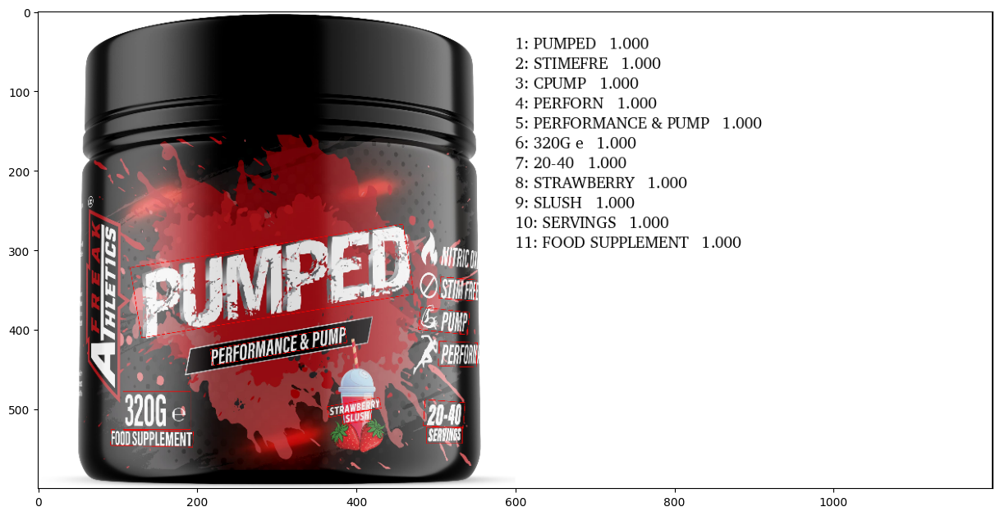

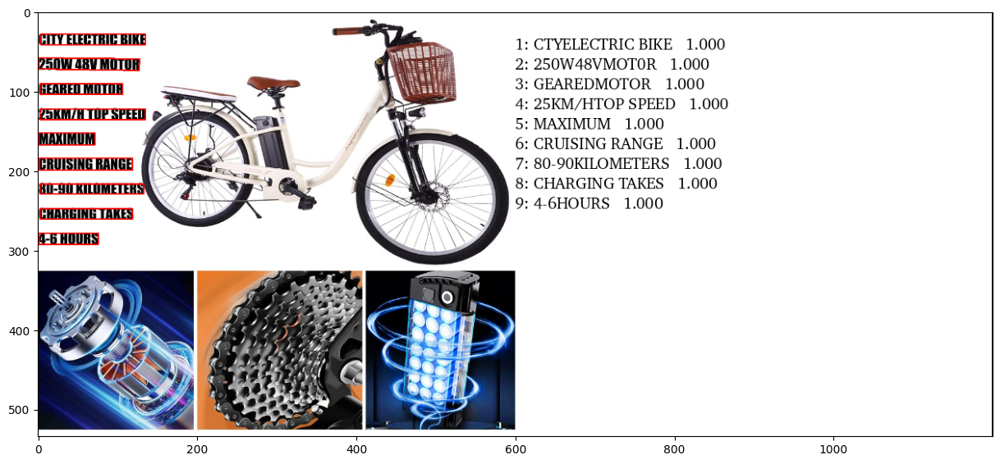

In [ ]:
def extract_text_from_images(folder_path, num_images=None):
    """
    Extracts text from images in a given folder using OCR.

    Args:
        folder_path (str): The path to the folder containing the images.
        num_images (int, optional): The maximum number of images to process. If None, all images are processed.
    """


    image_files = os.listdir(folder_path)
    if num_images is not None:
        image_files = image_files[:num_images]

    bunchOfResults = []
    for image_file in image_files:
        img_path = os.path.join(folder_path, image_file)
        result = ocr_model.ocr(img_path)[0]
        print(f"Image: {image_file}")
        resultStrSepBySpaces = ""
        for res in result:
            resultStrSepBySpaces += res[1][0] + " "
        bunchOfResults.append( { "filename": image_file, "result": resultStrSepBySpaces } )

        # Visualization
        Boxes = [res[0] for res in result] #
        Texts = [res[1][0] for res in result]
        Scores = [res[1][1] for res in result]
        Img = cv2.imread(img_path)
        Img = cv2.cvtColor(Img, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(15,15))
        Annotated = draw_ocr(Img, Boxes, Texts, font_path=font_path)
        plt.imshow(Annotated)
        # #########################################################

    return bunchOfResults


folder_path = "./trainImages"
print(  extract_text_from_images(folder_path, num_images=5) )  # Process only 5 images

#2. Regx part

[2024/09/15 23:15:50] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, use_mlu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='/root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6, max_text_length=25, rec_c

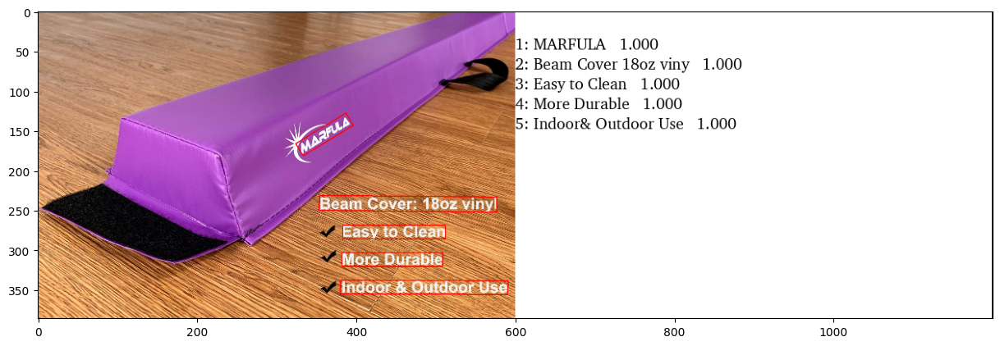

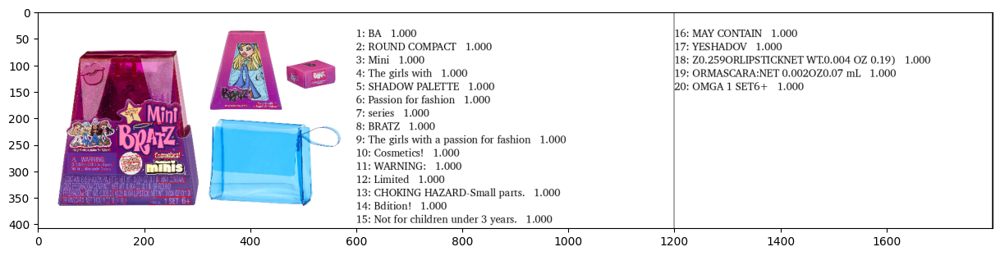

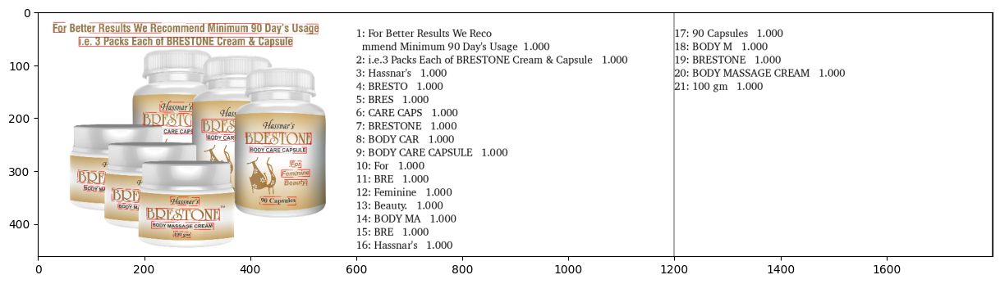

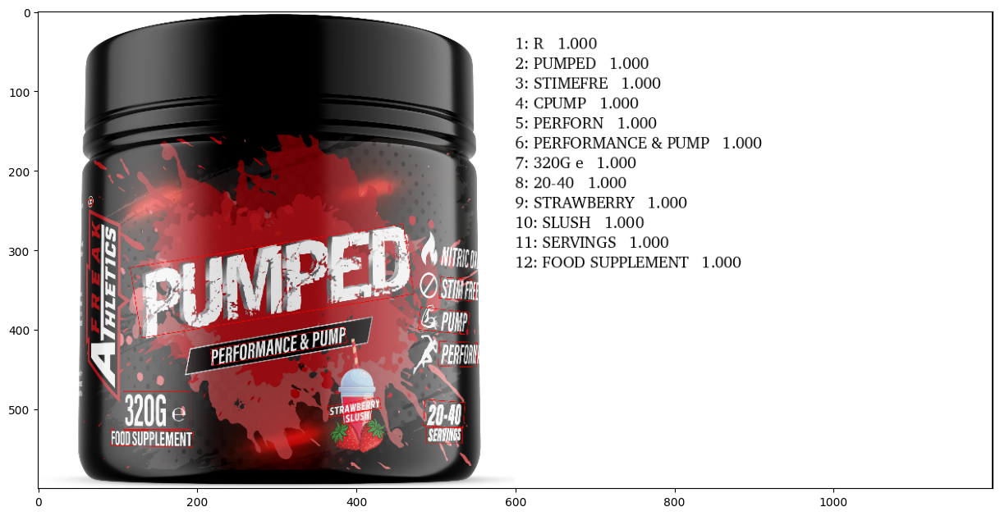

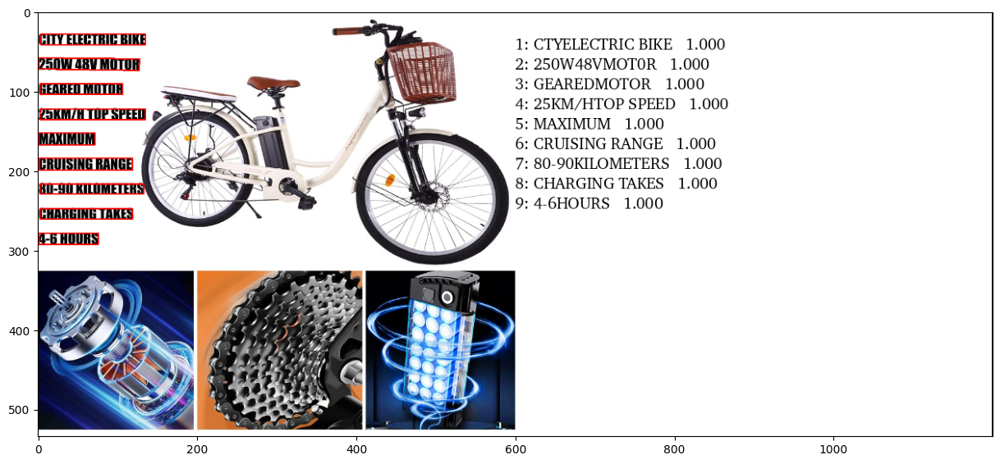

...

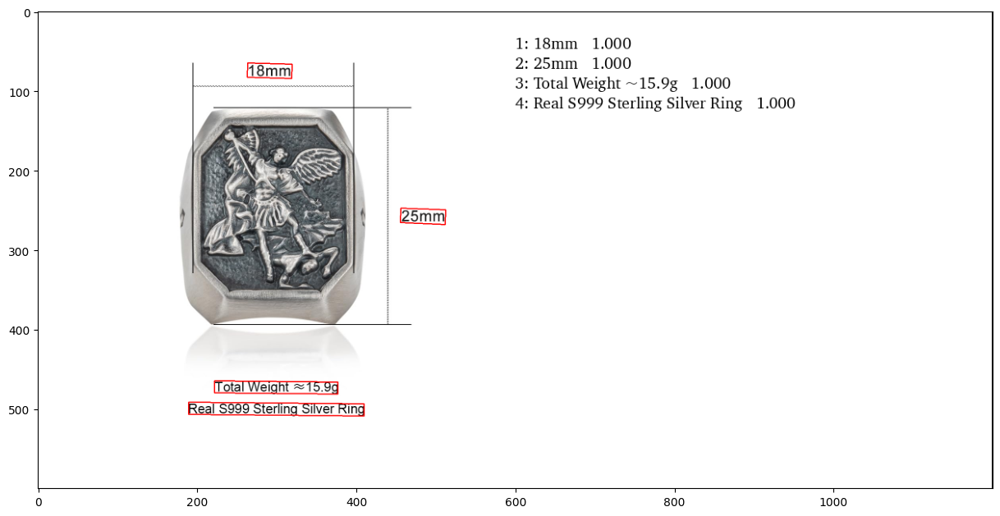

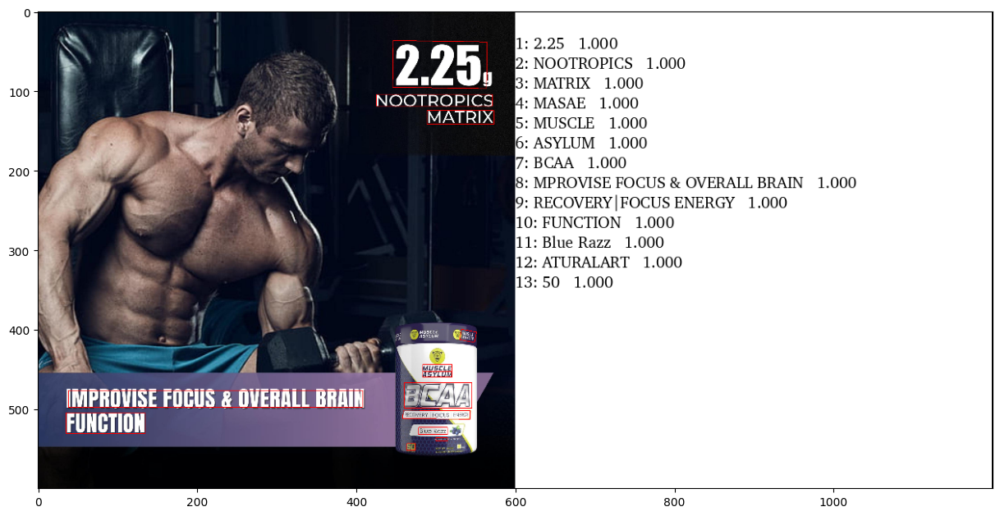

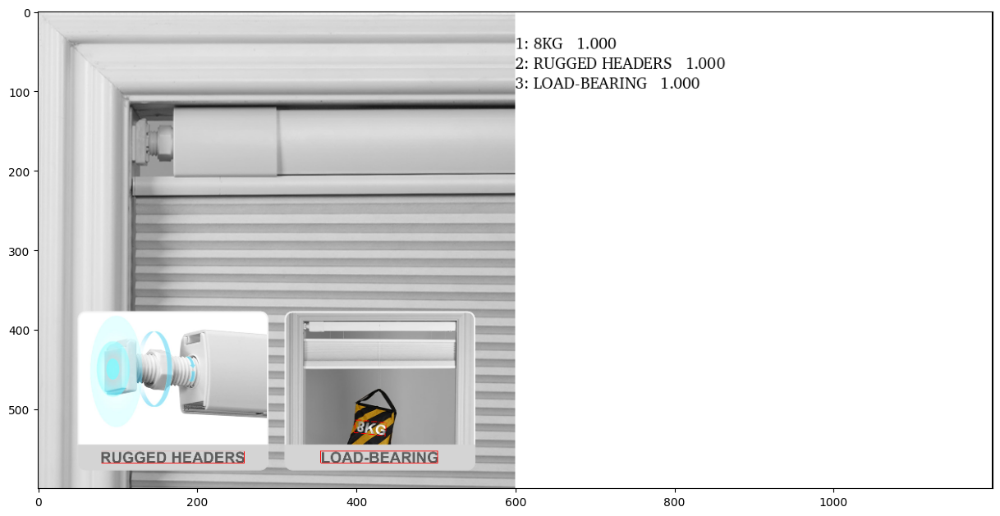

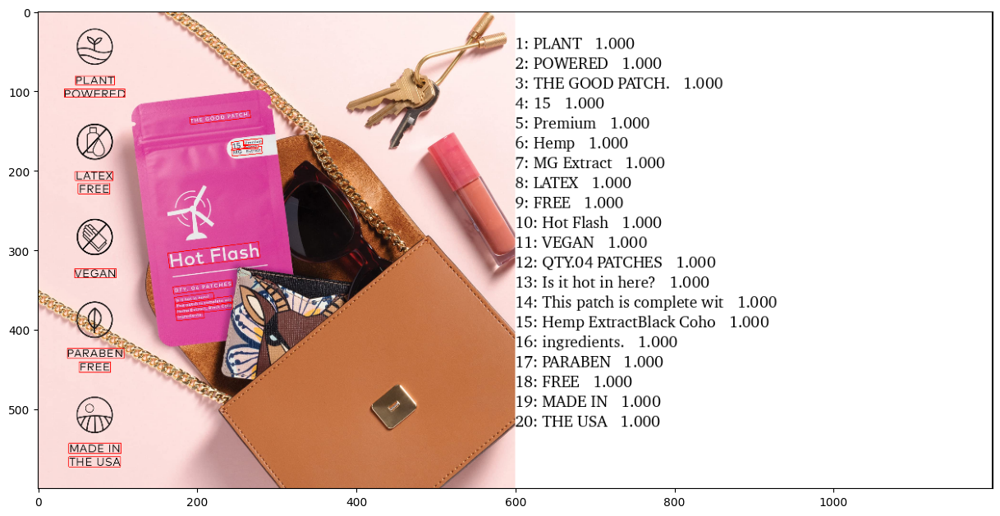

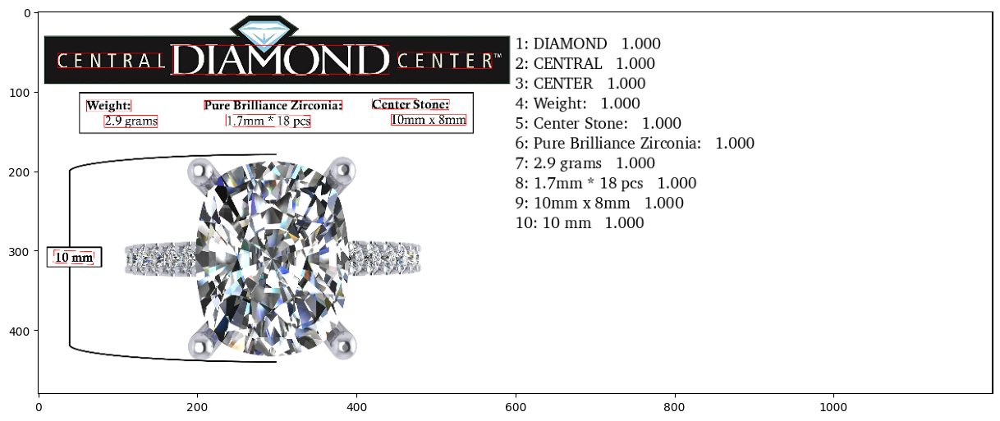

In [ ]:
import os
import re
import csv
import cv2
import matplotlib.pyplot as plt
from paddleocr import PaddleOCR

# Initialize OCR model
ocr_model = PaddleOCR(use_angle_cls=True, lang='en')

# Define the entity-unit map for filtering entities
entity_unit_map = {
    "width": ["centimetre", "foot", "millimetre", "metre", "inch", "yard", "cm", "mm", "m", "ft", "yd"],
    "depth": ["centimetre", "foot", "millimetre", "metre", "inch", "yard", "cm", "mm", "m", "ft", "yd"],
    "height": ["centimetre", "foot", "millimetre", "metre", "inch", "yard", "cm", "mm", "m", "ft", "yd"],
    "item_weight": ["milligram", "kilogram", "microgram", "gram", "ounce", "ton", "pound", "mg", "kg", "g", "oz", "lb", "lbs"],
    "maximum_weight_recommendation": ["milligram", "kilogram", "microgram", "gram", "ounce", "ton", "pound", "mg", "kg", "g", "oz", "lb", "lbs"],
    "voltage": ["millivolt", "kilovolt", "volt", "mV", "kV", "V"],
    "wattage": ["kilowatt", "watt", "kW", "W"],
    "item_volume": ["cubic foot", "microlitre", "cup", "fluid ounce", "centilitre", "imperial gallon", "pint", "decilitre", "litre", "millilitre", "quart", "cubic inch", "gallon", "ml", "l", "oz", "gal", "qt", "cu ft", "cu in"]
}

# Function to build regex for units
def build_unit_regex(units):
    unit_pattern = "|".join([re.escape(unit) for unit in units])
    return rf"(\d+(\.\d+)?)\s?({unit_pattern})"

# Function to extract entity data based on regex
def extract_entity_from_text(entity_name, text):
    pattern = build_unit_regex(entity_unit_map[entity_name])
    match = re.search(pattern, text, re.IGNORECASE)
    if match:
        return f"{match.group(1)} {match.group(3)}"  # Return the value with the unit
    return None

# Function to extract all entities from the given text
def extract_entities_from_text(ocr_text):
    extracted_entities = {}
    for entity_name in entity_unit_map:
        entity_value = extract_entity_from_text(entity_name, ocr_text)
        if entity_value:
            extracted_entities[entity_name] = entity_value
    return extracted_entities

# Apply regex entity extraction to all OCR results
# def process_ocr_results(ocr_results):
#     processed_data = []
#     for ocr_result in ocr_results:
#         filename = ocr_result["filename"]
#         text = ocr_result["ocr_result"]

#         # Apply entity extraction
#         extracted_entities = extract_entities_from_text(text)
#         processed_data.append({"filename": filename, "extracted_entities": extracted_entities})

#     return processed_data
def process_ocr_results(ocr_results):
    processed_data = []
    for ocr_result in ocr_results:
        filename = ocr_result["filename"]
        # Access the correct key "result" instead of "ocr_result"
        text = ocr_result["result"]

        # Apply entity extraction
        extracted_entities = extract_entities_from_text(text)
        processed_data.append({"filename": filename, "extracted_entities": extracted_entities})

    return processed_data


# Save the processed data to CSV
def save_to_csv(processed_results, output_file):
    with open(output_file, mode='w', newline='') as file:
        writer = csv.writer(file)
        writer.writerow(["filename", "extracted_entities"])

        for result in processed_results:
            filename = result["filename"]
            extracted_entities = result["extracted_entities"]
            # Convert the dictionary of extracted entities to a readable string
            entities_str = "; ".join([f"{key}: {value}" for key, value in extracted_entities.items()])
            writer.writerow([filename, entities_str])

# Main execution: Process images and save results
folder_path = "./trainImages"  # Path to your images folder

# Step 1: Extract text from the first 10 images using OCR
ocr_results = extract_text_from_images(folder_path, num_images=20)

# Step 2: Process the OCR results to extract entities
processed_results = process_ocr_results(ocr_results)

# Step 3: Save the results to a CSV file
output_csv = "test_output.csv"
save_to_csv(processed_results, output_csv)

# Print the processed results for inspection
for result in processed_results:
    print(f"Image: {result['filename']}, Extracted Entities: {result['extracted_entities']}")


In [ ]:
import csv
from sklearn.metrics import precision_score, recall_score, f1_score

# Load ground truth from CSV
def load_ground_truth(file_path):
    ground_truth = {}
    with open(file_path, mode='r') as file:
        reader = csv.DictReader(file)
        for row in reader:
            filename = row["filename"]
            # Access the correct column 'extracted_entities'
            entities_str = row["extracted_entities"]
            # Parse the entities string back into a dictionary
            entities = {}
            if entities_str:
                for entity_pair in entities_str.split('; '):
                    key, value = entity_pair.split(': ')
                    entities[key] = value
            ground_truth[filename] = entities
    return ground_truth

# Function to compare predictions and ground truth
def compute_scores(ground_truth, predictions):
    all_ground_truth = []
    all_predictions = []

    for result in predictions:
        filename = result["filename"]
        predicted_entities = result["extracted_entities"]

        # Only compare if the image has ground truth
        if filename in ground_truth:
            true_values = ground_truth[filename]

            # Compare each entity and append to the list
            for entity in true_values:
                all_ground_truth.append(true_values[entity])
                all_predictions.append(predicted_entities.get(entity, ""))

    # Compute precision, recall, and F1 score
    precision = precision_score(all_ground_truth, all_predictions, average='macro', zero_division=1)
    recall = recall_score(all_ground_truth, all_predictions, average='macro', zero_division=1)
    f1 = f1_score(all_ground_truth, all_predictions, average='macro', zero_division=1)

    return precision, recall, f1

# Example usage
ground_truth = load_ground_truth("test_output.csv")  # Load the manually labeled data
predictions = process_ocr_results(ocr_results)  # Extract entities from OCR text
precision, recall, f1 = compute_scores(ground_truth, predictions)  # Compute scores

print(f"Precision: {precision}, Recall: {recall}, F1 Score: {f1}")

Precision: 1.0, Recall: 1.0, F1 Score: 1.0


In [ ]:
# Print ground truth to verify
print("Ground Truth:", ground_truth)

# Print predictions to verify
print("Predictions:", predictions)

Ground Truth: {'81fRIl3bhHL.jpg': {'item_weight': '18 oz', 'maximum_weight_recommendation': '18 oz', 'item_volume': '18 oz'}, '8180lCAlYaL.jpg': {'width': '0.07 m', 'depth': '0.07 m', 'height': '0.07 m', 'item_weight': '0.004 OZ', 'maximum_weight_recommendation': '0.004 OZ', 'item_volume': '0.004 OZ'}, '71ZTyrP+83L.jpg': {'item_weight': '100 g', 'maximum_weight_recommendation': '100 g'}, '81XSbNecTKL.jpg': {'item_weight': '320 G', 'maximum_weight_recommendation': '320 G'}, '71OEmk050TL.jpg': {'voltage': '48 V', 'wattage': '250 W'}, '51lU0fJtiQL.jpg': {'width': '50 m', 'depth': '50 m', 'height': '50 m', 'item_volume': '50 ml'}, '61-hjAWHgXL.jpg': {'width': '1 inch', 'depth': '1 inch', 'height': '1 inch', 'item_weight': '3.37 oz', 'maximum_weight_recommendation': '3.37 oz', 'item_volume': '3.37 oz'}, '71c0GP5KuPL.jpg': {'item_weight': '70 KG', 'maximum_weight_recommendation': '70 KG'}, '71+fn9TWQmL.jpg': {'width': '50 m', 'depth': '50 m', 'height': '50 m', 'item_weight': '55 g', 'maximum